#**Problem Identification**

Try to predict the order quantity that may occur for the next 6 months.

#**Data Understanding**

## Import Dataset

In [ ]:
# Library
from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectKBest # Feature Selection
from sklearn.feature_selection import chi2
from sklearn.model_selection import train_test_split # Data Splitting

In [ ]:
# Path
drive.mount('/content/drive')
csv_path = '/content/drive/My Drive/KULIAH/MAGANG/UNITED TRACTORS (PATRIA) - DATA SCIENTIST/Technical Test/Database.csv'

Mounted at /content/drive


In [ ]:
# Dataset
df = pd.read_csv(csv_path)
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,114,CA-2014-115259,8/25/2014,8/27/2014,Second Class,RC-19960,Ryan Crowe,Consumer,United States,Columbus,...,43229,East,OFF-FA-10000621,Office Supplies,Fasteners,"OIC Colored Binder Clips, Assorted Sizes","40,096",14,"0,2","14,5348"
1,140,CA-2016-145583,10/13/2016,10/19/2016,Standard Class,LC-16885,Lena Creighton,Consumer,United States,Roseville,...,95661,West,FUR-FU-10001706,Furniture,Furnishings,Longer-Life Soft White Bulbs,"43,12",14,0,"20,6976"
2,576,CA-2015-149713,9/18/2015,9/22/2015,Second Class,TG-21640,Trudy Glocke,Consumer,United States,Long Beach,...,90805,West,OFF-PA-10004530,Office Supplies,Paper,Personal Creations Ink Jet Cards and Labels,"160,72",14,0,"78,7528"
3,661,CA-2015-146563,8/24/2015,8/28/2015,Standard Class,CB-12025,Cassandra Brandow,Consumer,United States,Arlington,...,76017,Central,OFF-ST-10001511,Office Supplies,Storage,Space Solutions Commercial Steel Shelving,"724,08",14,"0,2","-135,765"
4,1046,CA-2017-152702,10/12/2017,10/16/2017,Standard Class,SN-20710,Steve Nguyen,Home Office,United States,Rockford,...,61107,Central,FUR-CH-10002304,Furniture,Chairs,"Global Stack Chair without Arms, Black","254,604",14,"0,3","-18,186"


## Data Descriptions

In [ ]:
# Rows and Columns
print('This dataset has %d rows and %d columns.\n' %df.shape)

This dataset has 9994 rows and 21 columns.



In [ ]:
# Data Types
print('Data Types: \n')
df.info(verbose=True)

Data Types: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Row ID         9994 non-null   int64 
 1   Order ID       9994 non-null   object
 2   Order Date     9994 non-null   object
 3   Ship Date      9994 non-null   object
 4   Ship Mode      9994 non-null   object
 5   Customer ID    9994 non-null   object
 6   Customer Name  9994 non-null   object
 7   Segment        9994 non-null   object
 8   Country        9994 non-null   object
 9   City           9994 non-null   object
 10  State          9994 non-null   object
 11  Postal Code    9994 non-null   int64 
 12  Region         9994 non-null   object
 13  Product ID     9994 non-null   object
 14  Category       9994 non-null   object
 15  Sub-Category   9994 non-null   object
 16  Product Name   9994 non-null   object
 17  Sales          9994 non-null   object
 18  Quantity      

## Data Visualization

In [ ]:
# Copy Dataframe for Visualization
vdata = df.copy()

### Univariate

By Quantity

In [ ]:
# By The Quantity
uni_quantity = (vdata.groupby("Quantity")
                .agg(COUNT=("Quantity","count"))
                .sort_values(by=["COUNT"],ascending=False)
                .reset_index()
                )

uni_quantity.style.background_gradient(cmap='Blues')

,Quantity,COUNT
0,3,2409
1,2,2402
2,5,1230
3,4,1191
4,1,899
5,7,606
6,6,572
7,9,258
8,8,257
9,10,57


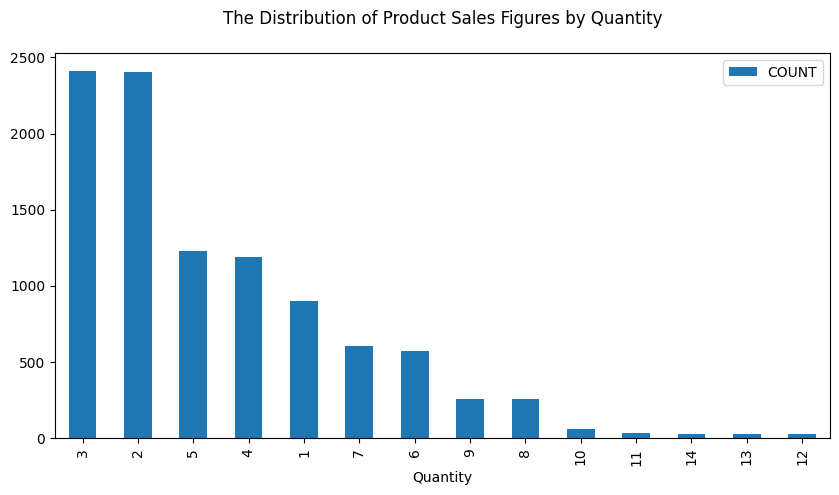

In [ ]:
# Graph Visualization
fig, ax = plt.subplots(figsize=(10, 5))
uni_quantity.plot(kind='bar', x='Quantity', y='COUNT', alpha=1.0, rot=90, ax=ax)
plt.title('The Distribution of Product Sales Figures by Quantity\n', fontsize=12)
plt.xticks(fontsize=10)
plt.show()

**Conclusion :**
The graph above shows that the number of products most often used in purchases is 3 and 2 pieces.

By City

In [ ]:
# By The City
uni_city = (vdata.groupby("City")
                .agg(COUNT=("City","count"))
                .sort_values(by=["COUNT"],ascending=False)
                .reset_index()
                )

uni_city.style.background_gradient(cmap='Blues')

,City,COUNT
0,New York City,915
1,Los Angeles,747
2,Philadelphia,537
3,San Francisco,510
4,Seattle,428
5,Houston,377
6,Chicago,314
7,Columbus,222
8,San Diego,170
9,Springfield,163


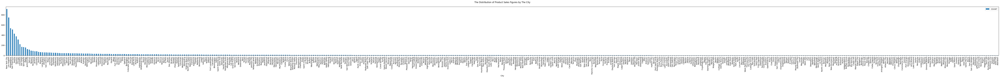

In [ ]:
# Graph Visualization
fig, ax = plt.subplots(figsize=(100, 5))
uni_city.plot(kind='bar', x='City', y='COUNT', alpha=1.0, rot=90, ax=ax)
plt.title('The Distribution of Product Sales Figures by The City\n', fontsize=12)
plt.xticks(fontsize=10)
plt.show()

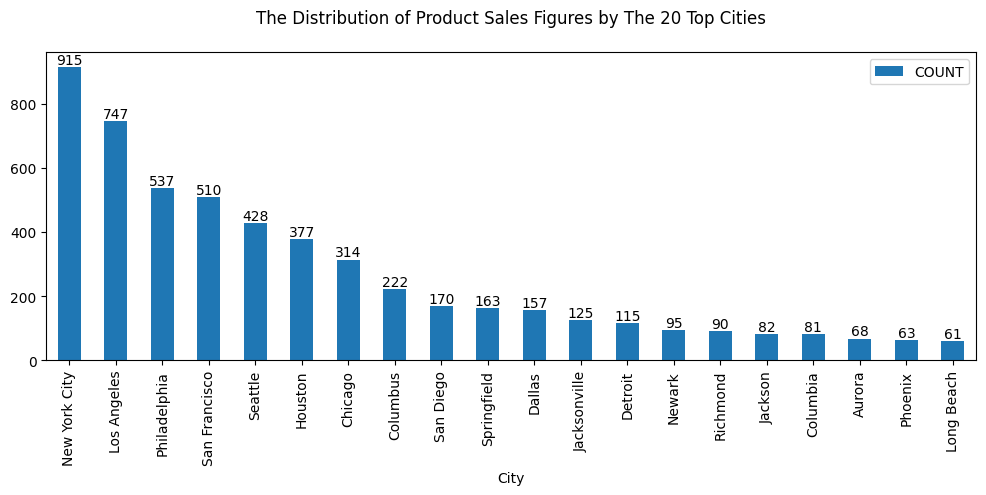

In [ ]:
# Top 20 City
uni_city_top20 = uni_city.head(20)
fig, ax = plt.subplots(figsize=(12, 4))
uni_city_top20.plot(kind='bar', x='City', y='COUNT', ax=ax, alpha=1.0, rot=90)
for bar in ax.patches:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom', ha='center')
ax.set_title('The Distribution of Product Sales Figures by The 20 Top Cities\n', fontsize=12)
plt.show()

**Conclusion :** The top 20 cities known to make the most purchases are New York City, Los Angeles, Philadelphia, San Francisco, Seattle, Houston, Chicago, Columbus, San Diego, Springfield, Dallas, Jacksonville, Detroit, Newark, Richmond, Jackson, Columbia, Aurora, Phoenix, and Long Beach.

By Month

In [ ]:
# Quantity by Month
# Date to Month
vdata['Order Date'] = pd.to_datetime(vdata['Order Date'])
vdata['Order Month'] = vdata['Order Date'].dt.strftime('%Y-%m')

uni_month = (vdata.groupby("Order Month")
                .agg(COUNT=("Order Date","count"))
                .sort_values(by=["COUNT"],ascending=False)
                .reset_index()
                )

uni_month.style.background_gradient(cmap='Blues')

,Order Month,COUNT
0,2017-12,462
1,2017-09,459
2,2017-11,459
3,2016-11,370
4,2016-09,363
5,2016-12,352
6,2015-11,324
7,2014-11,318
8,2015-12,316
9,2017-10,298


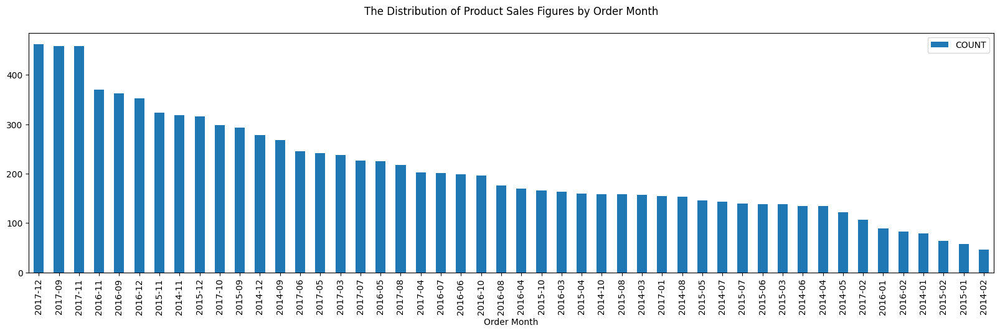

In [ ]:
# Graph Visualization
fig, ax = plt.subplots(figsize=(20, 5))
uni_month.plot(kind='bar', x='Order Month', y='COUNT', alpha=1.0, rot=90, ax=ax)
plt.title('The Distribution of Product Sales Figures by Order Month\n', fontsize=12)
plt.xticks(fontsize=10)
plt.show()

**Conclusion :** The most sales are known to be obtained at the end of the year in September, October, November, or December.

By Product ID

In [ ]:
# Quantity by Product ID
uni_productid = (vdata.groupby("Product ID")
                .agg(COUNT=("Product ID","count"))
                .sort_values(by=["COUNT"],ascending=False)
                .reset_index()
                )

uni_productid.style.background_gradient(cmap='Blues')

,Product ID,COUNT
0,OFF-PA-10001970,19
1,TEC-AC-10003832,18
2,FUR-FU-10004270,16
3,TEC-AC-10003628,15
4,FUR-CH-10002647,15
5,FUR-CH-10001146,15
6,TEC-AC-10002049,15
7,OFF-BI-10001524,14
8,OFF-PA-10002377,14
9,FUR-CH-10002880,14


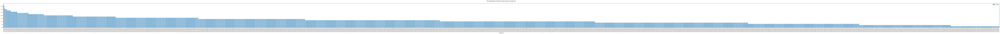

In [ ]:
# Graph Visualization
fig, ax = plt.subplots(figsize=(200, 5))
uni_productid.plot(kind='bar', x='Product ID', y='COUNT', alpha=1.0, rot=90, ax=ax)
plt.title('The Distribution of Product Sales Figures by Product ID\n', fontsize=12)
plt.xticks(fontsize=5)
plt.show()

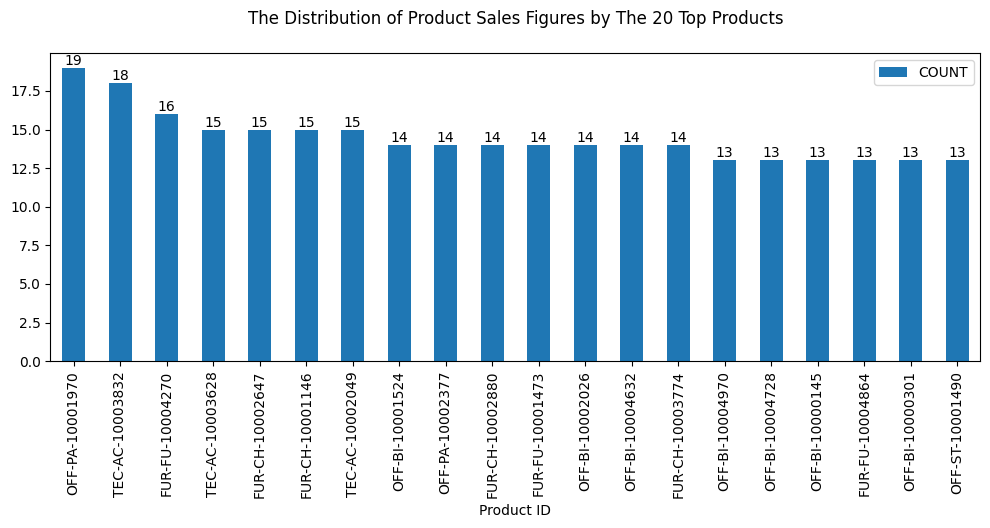

In [ ]:
# Top 20 Products
uni_productid_top20 = uni_productid.head(20)
fig, ax = plt.subplots(figsize=(12, 4))
uni_productid_top20.plot(kind='bar', x='Product ID', y='COUNT', ax=ax, alpha=1.0, rot=90)
for bar in ax.patches:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom', ha='center')
ax.set_title('The Distribution of Product Sales Figures by The 20 Top Products\n', fontsize=12)
plt.show()

**Conclusion :** The top position is occupied by products with the first id code OFF for Office Supplies, second FUR for furniture, and the last TEC for technology, seen from the overall top 20 products.

### Multivariate

In [ ]:
multi1 = vdata.groupby(by=['Order Month','City','Category'], as_index=False)['Quantity'].count()
print('Product Sale by The Order Month, City, Category Product, and Quantity')
multi1_sorted = multi1.sort_values(by='Quantity', ascending=False)
multi1_styled = multi1_sorted.style.background_gradient(cmap='Blues')
display(multi1_styled)

Product Sale by The Order Month, City, Category Product, and Quantity


,Order Month,City,Category,Quantity
4335,2017-11,New York City,Office Supplies,33
4516,2017-12,New York City,Office Supplies,30
2902,2016-11,Los Angeles,Office Supplies,30
3063,2016-12,New York City,Office Supplies,28
4025,2017-09,New York City,Office Supplies,25
2918,2016-11,New York City,Office Supplies,25
563,2014-09,New York City,Office Supplies,23
4567,2017-12,San Francisco,Office Supplies,22
4494,2017-12,Los Angeles,Office Supplies,21
1881,2015-12,Los Angeles,Office Supplies,21


<ipython-input-15-c07e196e529b>:8: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


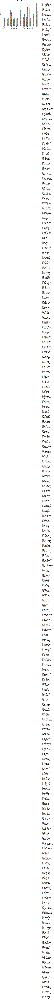

In [ ]:
# Plot Visualization
fig, ax = plt.subplots(figsize=(12, 8))
multi1_sorted.pivot(index='Order Month', columns=['City', 'Category'], values='Quantity').plot(kind='bar', ax=ax, stacked=True)
ax.set_title('Product Sale by The Order Month, City, and Category', fontsize=14)
ax.set_xlabel('Order Month')
ax.set_ylabel('Quantity')
ax.legend(title='City and Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

**Conclusion :** The highest sales position is occupied by New York City with the office supplies category which ranges at the end of the year between September and December.

Final Conclusion of Visualization

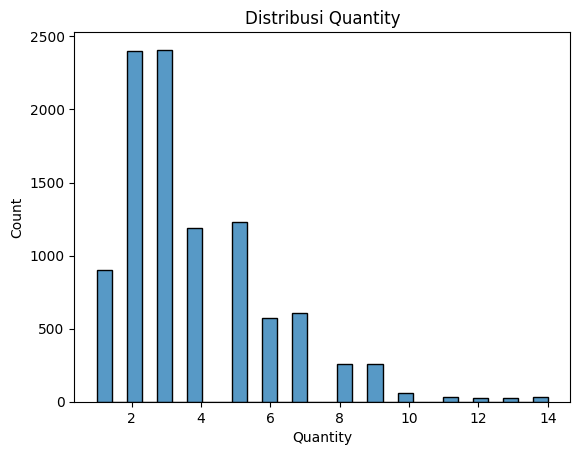

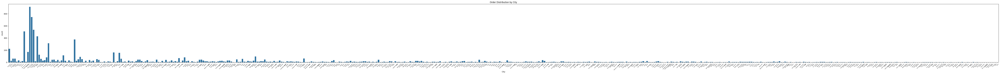

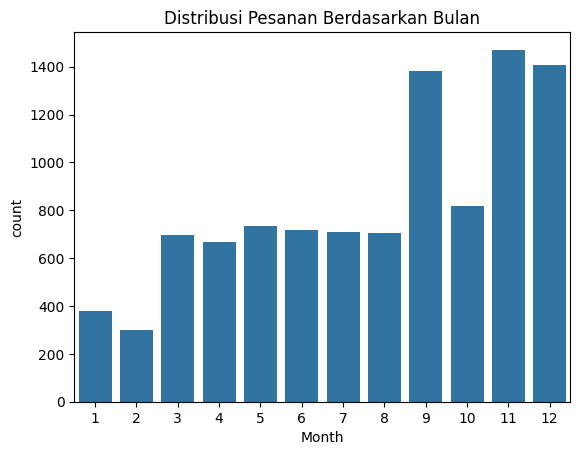

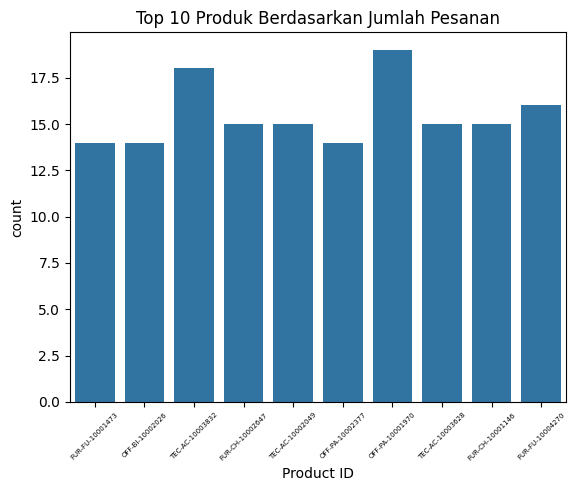

In [ ]:
# By Quantity
sns.histplot(df['Quantity'], bins=30)
plt.title('Distribusi Quantity')
plt.show()

# By City
plt.figure(figsize=(100, 6))
sns.countplot(data=df, x='City')
plt.title('Order Distribution by City')
plt.xticks(rotation=45, fontsize=5)
plt.show()

# By Month
df['Month'] = pd.to_datetime(df['Order Date']).dt.month
sns.countplot(data=df, x='Month')
plt.title('Distribusi Pesanan Berdasarkan Bulan')
plt.show()

# By Product ID
top_products = df['Product ID'].value_counts().head(10).index
sns.countplot(data=df[df['Product ID'].isin(top_products)], x='Product ID')
plt.title('Top 10 Produk Berdasarkan Jumlah Pesanan')
plt.xticks(rotation=45, fontsize=5)
plt.show()

Based on `Quantity Feature`, the most sales are with a quantity of 2-4pc per transaction.

Based on `City Feature`, the city with the most transactions is New York City.

Based on `Month`, sales achieved the highest transactions between September and December.

Based on `Product ID`, the highest sales are obtained by the office supplies category in the OFF code.

#**Data Pre-Processing**

##Data Cleaning

In [ ]:
# Missing Values
total_missing_values = df.isnull().sum().sum()
print(f'Sum of Missing Values: {total_missing_values}')

Sum of Missing Values: 0


##Convert Categoric to Numeric Values

In [ ]:
# First View of Dataset
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,114,CA-2014-115259,8/25/2014,8/27/2014,Second Class,RC-19960,Ryan Crowe,Consumer,United States,Columbus,...,43229,East,OFF-FA-10000621,Office Supplies,Fasteners,"OIC Colored Binder Clips, Assorted Sizes","40,096",14,"0,2","14,5348"
1,140,CA-2016-145583,10/13/2016,10/19/2016,Standard Class,LC-16885,Lena Creighton,Consumer,United States,Roseville,...,95661,West,FUR-FU-10001706,Furniture,Furnishings,Longer-Life Soft White Bulbs,"43,12",14,0,"20,6976"
2,576,CA-2015-149713,9/18/2015,9/22/2015,Second Class,TG-21640,Trudy Glocke,Consumer,United States,Long Beach,...,90805,West,OFF-PA-10004530,Office Supplies,Paper,Personal Creations Ink Jet Cards and Labels,"160,72",14,0,"78,7528"
3,661,CA-2015-146563,8/24/2015,8/28/2015,Standard Class,CB-12025,Cassandra Brandow,Consumer,United States,Arlington,...,76017,Central,OFF-ST-10001511,Office Supplies,Storage,Space Solutions Commercial Steel Shelving,"724,08",14,"0,2","-135,765"
4,1046,CA-2017-152702,10/12/2017,10/16/2017,Standard Class,SN-20710,Steve Nguyen,Home Office,United States,Rockford,...,61107,Central,FUR-CH-10002304,Furniture,Chairs,"Global Stack Chair without Arms, Black","254,604",14,"0,3","-18,186"


In [ ]:
# Making Sales, Discount, Profit to be Float
def clean_and_convert(df, columns):
    for col in columns:
        df[col] = df[col].str.replace(',', '').astype(float)
columns_to_clean = ['Sales', 'Discount', 'Profit']
clean_and_convert(df, columns_to_clean)
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,114,CA-2014-115259,8/25/2014,8/27/2014,Second Class,RC-19960,Ryan Crowe,Consumer,United States,Columbus,...,43229,East,OFF-FA-10000621,Office Supplies,Fasteners,"OIC Colored Binder Clips, Assorted Sizes",40096.0,14,2.0,145348.0
1,140,CA-2016-145583,10/13/2016,10/19/2016,Standard Class,LC-16885,Lena Creighton,Consumer,United States,Roseville,...,95661,West,FUR-FU-10001706,Furniture,Furnishings,Longer-Life Soft White Bulbs,4312.0,14,0.0,206976.0
2,576,CA-2015-149713,9/18/2015,9/22/2015,Second Class,TG-21640,Trudy Glocke,Consumer,United States,Long Beach,...,90805,West,OFF-PA-10004530,Office Supplies,Paper,Personal Creations Ink Jet Cards and Labels,16072.0,14,0.0,787528.0
3,661,CA-2015-146563,8/24/2015,8/28/2015,Standard Class,CB-12025,Cassandra Brandow,Consumer,United States,Arlington,...,76017,Central,OFF-ST-10001511,Office Supplies,Storage,Space Solutions Commercial Steel Shelving,72408.0,14,2.0,-135765.0
4,1046,CA-2017-152702,10/12/2017,10/16/2017,Standard Class,SN-20710,Steve Nguyen,Home Office,United States,Rockford,...,61107,Central,FUR-CH-10002304,Furniture,Chairs,"Global Stack Chair without Arms, Black",254604.0,14,3.0,-18186.0


In [ ]:
# Making Order Date to be DateTime
df['Order Date'] = pd.to_datetime(df['Order Date'])
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,114,CA-2014-115259,2014-08-25,8/27/2014,Second Class,RC-19960,Ryan Crowe,Consumer,United States,Columbus,...,43229,East,OFF-FA-10000621,Office Supplies,Fasteners,"OIC Colored Binder Clips, Assorted Sizes",40096.0,14,2.0,145348.0
1,140,CA-2016-145583,2016-10-13,10/19/2016,Standard Class,LC-16885,Lena Creighton,Consumer,United States,Roseville,...,95661,West,FUR-FU-10001706,Furniture,Furnishings,Longer-Life Soft White Bulbs,4312.0,14,0.0,206976.0
2,576,CA-2015-149713,2015-09-18,9/22/2015,Second Class,TG-21640,Trudy Glocke,Consumer,United States,Long Beach,...,90805,West,OFF-PA-10004530,Office Supplies,Paper,Personal Creations Ink Jet Cards and Labels,16072.0,14,0.0,787528.0
3,661,CA-2015-146563,2015-08-24,8/28/2015,Standard Class,CB-12025,Cassandra Brandow,Consumer,United States,Arlington,...,76017,Central,OFF-ST-10001511,Office Supplies,Storage,Space Solutions Commercial Steel Shelving,72408.0,14,2.0,-135765.0
4,1046,CA-2017-152702,2017-10-12,10/16/2017,Standard Class,SN-20710,Steve Nguyen,Home Office,United States,Rockford,...,61107,Central,FUR-CH-10002304,Furniture,Chairs,"Global Stack Chair without Arms, Black",254604.0,14,3.0,-18186.0


In [ ]:
# Categorical and Numerical Features Definition
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

print("Categorical columns:", categorical_cols)
print("Numerical columns:", numerical_cols)

Categorical columns: Index(['Order ID', 'Ship Date', 'Ship Mode', 'Customer ID', 'Customer Name',
       'Segment', 'Country', 'City', 'State', 'Region', 'Product ID',
       'Category', 'Sub-Category', 'Product Name'],
      dtype='object')
Numerical columns: Index(['Row ID', 'Postal Code', 'Sales', 'Quantity', 'Discount', 'Profit'], dtype='object')


In [ ]:
# Convert Categorical Features to Numeric
label_encoder = LabelEncoder()
for col in categorical_cols:
    df[col] = label_encoder.fit_transform(df[col].astype(str))
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,114,197,2014-08-25,1175,2,629,662,0,0,94,...,43229,1,908,1,8,1197,40096.0,14,2.0,145348.0
1,140,2399,2016-10-13,132,3,451,457,0,0,418,...,95661,3,192,0,9,1029,4312.0,14,0.0,206976.0
2,576,1459,2015-09-18,1274,2,748,773,0,0,262,...,90805,3,1270,1,12,1259,16072.0,14,0.0,787528.0
3,661,1420,2015-08-24,1179,3,125,133,0,0,16,...,76017,0,1345,1,14,1475,72408.0,14,2.0,-135765.0
4,1046,3853,2017-10-12,122,3,704,712,2,0,413,...,61107,0,85,0,5,766,254604.0,14,3.0,-18186.0


##Drop of Unnecessary Features

In [ ]:
# Drop Unnecessary Features
df.drop(['Row ID', 'Order ID'], inplace=True, axis=1)
df.head()

,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,2014-08-25,1175,2,629,662,0,0,94,33,43229,1,908,1,8,1197,40096.0,14,2.0,145348.0
1,2016-10-13,132,3,451,457,0,0,418,3,95661,3,192,0,9,1029,4312.0,14,0.0,206976.0
2,2015-09-18,1274,2,748,773,0,0,262,3,90805,3,1270,1,12,1259,16072.0,14,0.0,787528.0
3,2015-08-24,1179,3,125,133,0,0,16,41,76017,0,1345,1,14,1475,72408.0,14,2.0,-135765.0
4,2017-10-12,122,3,704,712,2,0,413,11,61107,0,85,0,5,766,254604.0,14,3.0,-18186.0


##Conversion of Negative Values to Positive

In [ ]:
#Making Profit Feature to be Absolute Values
df.iloc[:,18] = df.iloc[:,18].abs()
df.head()

,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,2014-08-25,1175,2,629,662,0,0,94,33,43229,1,908,1,8,1197,40096.0,14,2.0,145348.0
1,2016-10-13,132,3,451,457,0,0,418,3,95661,3,192,0,9,1029,4312.0,14,0.0,206976.0
2,2015-09-18,1274,2,748,773,0,0,262,3,90805,3,1270,1,12,1259,16072.0,14,0.0,787528.0
3,2015-08-24,1179,3,125,133,0,0,16,41,76017,0,1345,1,14,1475,72408.0,14,2.0,135765.0
4,2017-10-12,122,3,704,712,2,0,413,11,61107,0,85,0,5,766,254604.0,14,3.0,18186.0


#**Data Splitting**

##Target Variable & Features

In [ ]:
# Because datetime cannot be used in the SelectKBest function,
# So it must be replaced separately into year, date and month.
# Convert to 3 Columns
df['Year'] = df['Order Date'].dt.year
df['Month'] = df['Order Date'].dt.month
df['Day'] = df['Order Date'].dt.day
# Drop 'OrderDate'
df.drop(columns=['Order Date'], inplace=True)
df.head()

,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,...,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Year,Month,Day
0,1175,2,629,662,0,0,94,33,43229,1,...,1,8,1197,40096.0,14,2.0,145348.0,2014,8,25
1,132,3,451,457,0,0,418,3,95661,3,...,0,9,1029,4312.0,14,0.0,206976.0,2016,10,13
2,1274,2,748,773,0,0,262,3,90805,3,...,1,12,1259,16072.0,14,0.0,787528.0,2015,9,18
3,1179,3,125,133,0,0,16,41,76017,0,...,1,14,1475,72408.0,14,2.0,135765.0,2015,8,24
4,122,3,704,712,2,0,413,11,61107,0,...,0,5,766,254604.0,14,3.0,18186.0,2017,10,12


In [ ]:
# Defining Target and Features
# Features
x = df.drop(['Quantity'], axis=1)
# Target Variable
y = df['Quantity']

##Feature Selection

In [ ]:
# Feature Selection
bestFeatures = SelectKBest(score_func=chi2, k=10)
fit = bestFeatures.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
featureScores = pd.concat([dfcolumns, dfscores], axis=1)
featureScores.columns = ['Features', 'Score']
total_score = featureScores['Score'].sum()
featureScores['Percentage'] = (featureScores['Score'] / total_score) * 100
featureScores['Percentage'] = featureScores['Percentage'].round(3)
sorted_featureScores = featureScores.sort_values(by=['Percentage'], ascending=False)
print('The Features that Correlate Well with Target Feature:\n')
featureScores.sort_values(by=['Score'], ascending=False)

The Features that Correlate Well with Target Feature:



,Features,Score,Percentage
16,Profit,1.633894e+09,79.022
14,Sales,4.334981e+08,20.966
8,Postal Code,2.493098e+05,0.012
0,Ship Date,5.653857e+03,0.000
13,Product Name,3.462268e+03,0.000
3,Customer Name,1.711986e+03,0.000
2,Customer ID,1.528754e+03,0.000
10,Product ID,1.408349e+03,0.000
6,City,1.198439e+03,0.000
7,State,8.502752e+01,0.000


##Final Data Splitting

In [ ]:
# Define X and Y Features
x_chosen = df[['Profit', 'Sales', 'Postal Code', 'Month']]
y_chosen = df['Quantity']

In [ ]:
# Preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), ['Profit', 'Sales', 'Month']),
        ('cat', OneHotEncoder(handle_unknown='ignore'), ['Postal Code'])
    ])

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(x_chosen, y_chosen, test_size=0.2, random_state=42)

#**Model Building**

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

## Linear Regression

In [ ]:
# Model pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', LinearRegression())
])

In [ ]:
# Train the model
pipeline.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Profit', 'Sales', 'Month']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Postal Code'])])),
                ('model', LinearRegression())])

#**Validation**

In [ ]:
# Future months for prediction
future_months = pd.date_range(start='2024-08-01', periods=6, freq='M').to_period('M')
future_month_nums = [m.ordinal for m in future_months]

# Data untuk prediksi
future_data = {
    'Profit': [0] * 6,  # Placeholder values
    'Sales': [0] * 6,  # Placeholder values
    'Postal Code': ['12345'] * 6,  # Placeholder values
    'Month': future_month_nums
}

future_df = pd.DataFrame(future_data)

# Prediksi
predictions = pipeline.predict(future_df)

# Tampilkan hasil prediksi
predictions_df = pd.DataFrame({
    'Month': future_months,
    'Predicted Quantity': predictions
})

print(predictions_df)

     Month  Predicted Quantity
0  2024-08           12.835981
1  2024-09           12.850056
2  2024-10           12.864130
3  2024-11           12.878204
4  2024-12           12.892278
5  2025-01           12.906353
